In [1]:
%matplotlib inline

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import wavfile
import scipy.signal
from pydub import AudioSegment
from pydub.effects import low_pass_filter, high_pass_filter
import IPython

D:\Anaconda\Lib\site-packages\pydub\utils.py:170: RuntimeWarning: Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work
  warn("Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work", RuntimeWarning)


# Audio Filters and Equalizers

## 1. Introduction
Digital audio processing encompasses a broad range of techniques for manipulating sound, and at the heart of these techniques are audio filters and equalizers. This project delves into the mathematical concepts and practical implementations of these essential tools using Python.

### What is an audio signal?
An audio signal refers to an electrical representation of sound waves that can be captured, transmitted, stored, or processed by electronic devices. It carries the essential information of the sound, including its frequency, amplitude, and phase, allowing us to perceive and reproduce auditory experiences. In simple terms, when we speak, play music, or any other sound is produced, it creates vibrations in the air. These vibrations travel as sound waves and eventually reach our ears. An audio signal converts these sound waves into an electrical signal that can be used by various technological devices, such as speakers. (1)

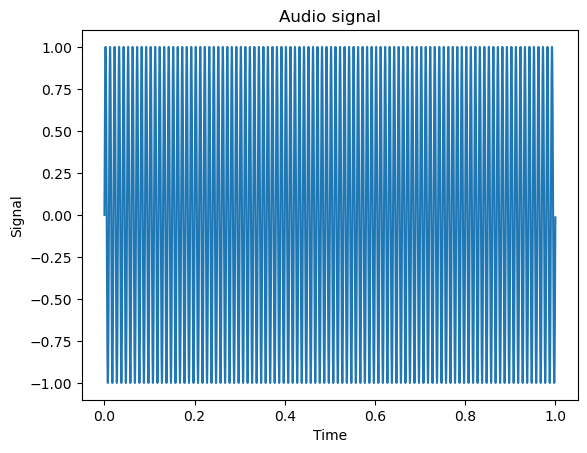

In [3]:
sr = 44100 # колко стойности записваме в опрделен отрязък (1 сек)
frequency = 100
length = 1.0

t = np.arange(0, length, 1.0/sr)
signal = np.sin(np.pi * 2 * frequency * t)

plt.plot(t, signal)
plt.title("Audio signal")
plt.xlabel("Time")
plt.ylabel("Signal")
plt.show()

In [4]:
signal *= 32767 # we use it as a constant 
signal = np.int16(signal)
wavfile.write("audio_signal.wav", sr, signal)

### What is sample width, sample rate(frequency)?
#### Sample rate
Sample rate is the number of samples per second that are taken of a waveform to create a discete digital signal. The higher the sample rate, the more snapshots you capture of the audio signal. (3)

<img src="images/sample_rate.jpg" alt="Sample Rate image" style="width:400px;height:200px;">

#### Sample width (bit depth)
The audio bit depth determines the number of possible amplitude values we can record for each audio sample. The higher the bit depth, the more amplitude values per sample are captured to recreate the original audio signal. (3)

Всеки sample се записва с число 
С колкото повече числа се представя всяка една извадка, толкова по-качествен е звукът

<img src="images/bit_depth.png" alt="Sample Rate image" style="width:400px;height:200px;">

### What is time domain?
In signal processing, the "time domain" refers to the analysis of mathematical functions or physical signals with respect to time. It is one of the fundamental domains used to describe and analyze signals.

#### Representation
* In the time domain, a signal is represented as a function of time. For instance, if x(t) represents a signal, it shows how the signal varies over time t.
* The horizontal axis typically represents time, while the vertical axis represents the signal's amplitude or intensity.

#### Continuous-Time and Discrete-Time Signals

##### 1. Continuous-Time Signals
* Continuous-Time Signals are defined for every moment in time.
For example, an analog signal like a sine wave can be described by the formula:
$$x(t) = A \sin(2 \pi f t + \phi)$$
Where:
* $A$ is amplitude, 
* $f$ is frequency
* $ϕ$ is phase.

##### 2. Discrete-Time Signals
* Discrete-Time Signals are defined only at specific time intervals, usually resulting from sampling a continuous-time signal. An example is $x[n]$, where $n$ represents discrete time instances.

### What is a spectrogram and how to interpret it?
A spectrogram, often referred to as a sonogram, voiceprint, or voicegram, is a visual representation of the spectrum of frequencies in a signal as they evolve over time. In essence, it provides a three-dimensional view of a sound signal, with the three dimensions being time, frequency, and amplitude.

1. Time: Represented on the horizontal x-axis, it shows the progression of the signal from its start to its end.
<br>
2. Frequency: Captured on the vertical y-axis, it illustrates the range of frequencies contained within the signal, from the lowest to the highest.
<br>
3. Amplitude: Depicted through the color or intensity of the plot, it indicates the strength or loudness of a frequency at a specific point in time.

In [5]:
samplerate, data = wavfile.read("Harvard_List_01_1.wav")

IPython.display.Audio("Harvard_List_01_1.wav")

C:\Users\Цецо\AppData\Local\Temp\ipykernel_14712\1942433838.py:1: WavFileWarning: Chunk (non-data) not understood, skipping it.
  samplerate, data = wavfile.read("Harvard_List_01_1.wav")


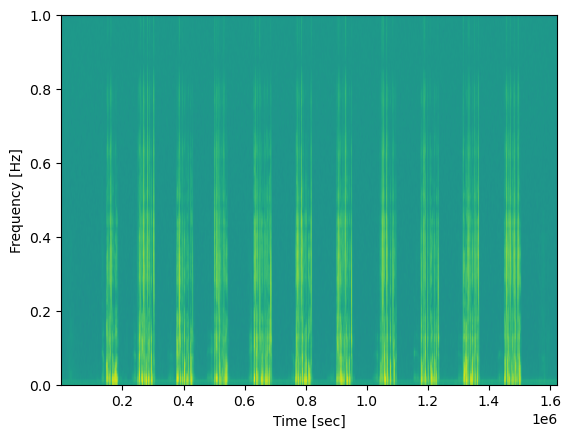

In [6]:
plt.specgram(data)
plt.xlabel('Time [sec]')
plt.ylabel('Frequency [Hz]')
plt.show()

## Audio Filters
### 1. Definition
An audio filter is a tool, either hardware or software, designed to alter the frequency content of an audio signal. Essentially, filters work by removing certain frequencies while allowing others to pass through. With audio filters, we have the capability to target individual frequencies or entire groups of frequencies, referred to as bands..

### 2. Types
There are various kinds of audio filters, such as low-pass filters, high-pass filters, band-pass filters, and notch filters, among others. Each filter type has distinct properties and serves different functions in audio processing.

#### What is a low-pass filter?
A low-pass filter is a type of audio filter that allows low frequency signals to pass through, but blocks or attenuates high frequency signals. In other words, a low-pass filter “passes” low frequencies and “cuts” or filters out high frequencies. (8)

In [18]:
def lowpass(data: np.ndarray, cutoff: float, sample_rate: float, poles: int = 5):
    sos = scipy.signal.butter(poles, cutoff, 'lowpass', fs=sample_rate, output='sos')
    filtered_data = scipy.signal.sosfiltfilt(sos, data)
    return filtered_data

# Load sample data from a WAV file
sample_rate, data = scipy.io.wavfile.read('ecg.wav')
times = np.arange(len(data))/sample_rate

# Apply a 50 Hz low-pass filter to the original data
filtered = lowpass(data, 50, sample_rate)

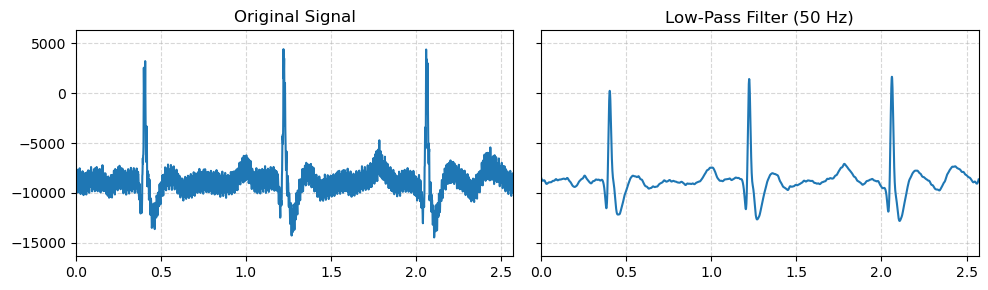

In [20]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 3), sharex=True, sharey=True)
ax1.plot(times, data)
ax1.set_title("Original Signal")
ax1.margins(0, .1)
ax1.grid(alpha=.5, ls='--')
ax2.plot(times, filtered)
ax2.set_title("Low-Pass Filter (50 Hz)")
ax2.grid(alpha=.5, ls='--')
plt.tight_layout()
plt.show()

#### What is a high-pass filter?
A high-pass filter is a type of audio filter that allows high frequency signals to pass through, but blocks or attenuates low frequency signals. Since high-pass filters are useful to cut low frequencies, a high-pass is sometimes called a “low cut,” the same way a low-pass is occasionally called a “high cut.”

In [27]:
def highpass(data: np.ndarray, cutoff: float, sample_rate: float, poles: int = 5):
    sos = scipy.signal.butter(poles, cutoff, 'highpass', fs=sample_rate, output='sos')
    filtered_data = scipy.signal.sosfiltfilt(sos, data)
    return filtered_data

# Load sample data from a WAV file
sample_rate, data = scipy.io.wavfile.read('ecg.wav')
times = np.arange(len(data))/sample_rate

# Apply a 20 Hz high-pass filter to the original data
filtered = highpass(data, 20, sample_rate)

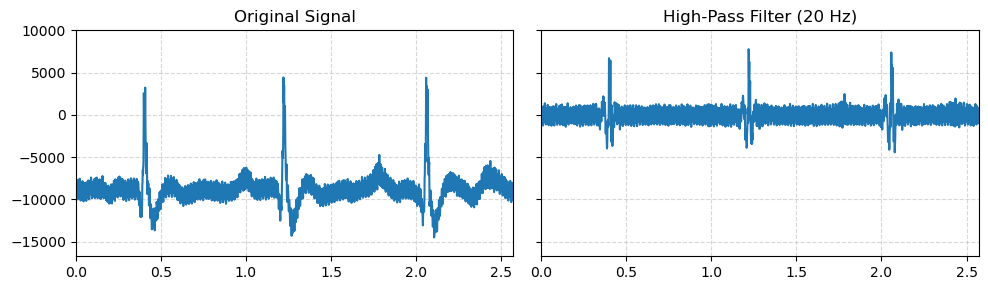

In [28]:
# Code used to display the result
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 3), sharex=True, sharey=True)
ax1.plot(times, data)
ax1.set_title("Original Signal")
ax1.margins(0, .1)
ax1.grid(alpha=.5, ls='--')
ax2.plot(times, filtered)
ax2.set_title("High-Pass Filter (20 Hz)")
ax2.grid(alpha=.5, ls='--')
plt.tight_layout()
plt.show()

#### What is a band-pass filter?
A band-pass filter is a type of audio filter that allows a specific range of frequencies (also known as a band) to pass through, while blocking frequencies below and above this range. This can be useful for isolating a particular range of frequencies in an audio signal, or for shaping the tonal character of a sound by boosting or cutting a specific range of frequencies. 
With a band-pass filter, it’s helpful to think of it as a way to select a specific range of sounds by using both the high-pass and low-pass frequencie

In [29]:
def bandpass(data: np.ndarray, edges: list[float], sample_rate: float, poles: int = 5):
    sos = scipy.signal.butter(poles, edges, 'bandpass', fs=sample_rate, output='sos')
    filtered_data = scipy.signal.sosfiltfilt(sos, data)
    return filtered_data

# Load sample data from a WAV file
sample_rate, data = scipy.io.wavfile.read('ecg.wav')
times = np.arange(len(data))/sample_rate

# Apply a 10-50 Hz high-pass filter to the original data
filtered = bandpass(data, [10, 50], sample_rate)

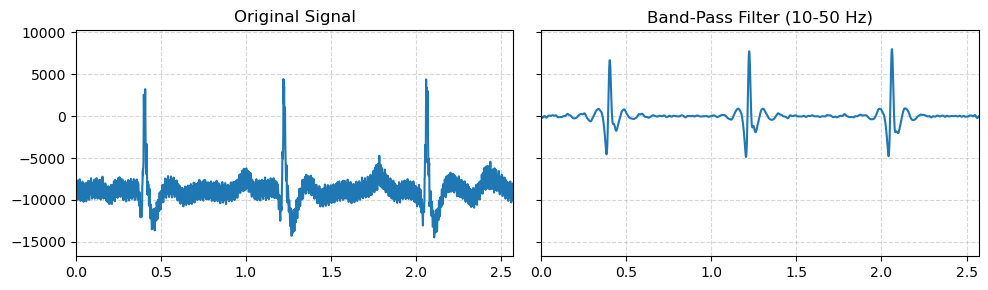

In [30]:
# Code used to display the result
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 3), sharex=True, sharey=True)
ax1.plot(times, data)
ax1.set_title("Original Signal")
ax1.margins(0, .1)
ax1.grid(alpha=.5, ls='--')
ax2.plot(times, filtered)
ax2.set_title("Band-Pass Filter (10-50 Hz)")
ax2.grid(alpha=.5, ls='--')
plt.tight_layout()
plt.show()

#### What is a band-stop filter?
A band-stop filter is a filter that allows us to let everything pass, while selecting a band of frequencies to remove.

Applying different types of filters to the original signal to hear the difference.

### How does the Fourier transform work?
First of all, let me explain what the Fourier transform is and what it would be useful for.

Fourier Transform is a mathematical model which helps to transform the signals between two different domains, such as transforming signal from frequency domain to time domain or vice versa. It's a tool that breaks a waveform (a function or signal) into an alternate representation, characterized by the sine and cosine functions of varying frequencies. The Fourier's theorem states that every signal can be expressed by a combination of a proper set of sine waves.

The equation for the Forward Fourier Transform is:

$$ S_x(f) = \int_{-\infty}^{+\infty} x(t) e^{-i 2 \pi f t} \, dt $$ 

Where:

* $S_x(f)$ is the output of the Fourier Transform in the frequency domain
* $x(t)$ is the input time domain function
* $2πf$ is the frequency in radians per second
* $j$ is the imaginary unit.

Complex numbers in the Fourier Transform indicate how much of the energy for a given frequency is in the sine or cosine component. This is known as the phase.


Аccordingly, there is a reverse process - Inverse Fourier transformation. It is a mathematical formula that converts a signal in the frequency domain $ω$ to one in the time (or spatial) domain $t$.

$$ f(x) = \int_{-\infty}^{\infty} F(k) e^{i 2 \pi k x} \, dk $$

Where:

* $f(x)$ is the original time-domain function
* $F(k)$ is the Fourier transform of $𝑓(𝑥)$, which represents the function in the frequency domain.
* $e^{i 2 \pi k x}$ is the complex exponential function, where $i$ is the imaginary unit, $k$ is the frequency variable, and $x$ is the time (or spatial) variable.
* The integral runs from $−∞$ to $∞$, indicating that all frequencies are considered in reconstructing the time-domain function.

Two types of Fourier Transforms are commonly used today in computer based applications: 
* The Discrete Fourier Transform (DFT) and the Fast Fourier Transform (FFT):

Discrete Fourier Transform (DFT) performs a Fourier Transform on a discrete time block. A DFT can be performed on any time signal composed of an arbitrary number of data points. It is defiined as:

$$X_k = \sum_{n=0}^{N-1} x_n \cdot e^{-i \frac{2 \pi}{N} k n}, \quad k = 0, 1, \ldots, N-1$$

The inverse Discrete Fourier Transform (IDFT) is defined as:

$$x_n = \frac{1}{N} \sum_{k=0}^{N-1} X_k \cdot e^{i \frac{2 \pi}{N} k n}, \quad n = 0, 1, \ldots, N-1$$

The Fast Fourier Transform (FFT) is an algorithm to compute the Discrete Fourier Transform (DFT) and its inverse efficiently. The FFT reduces the complexity of computing the DFT from $O(N^2)$ to $O(N \log N)$, making it very useful for large datasets.

In complex analysis, Euler's formula provides a fundamental bridge between the exponential function and the trigonometric functions. For complex numbers x, Euler's formula says that:

$$e^{ix} = \cos x + i \sin x
$$

Fourier Transform Demonstration

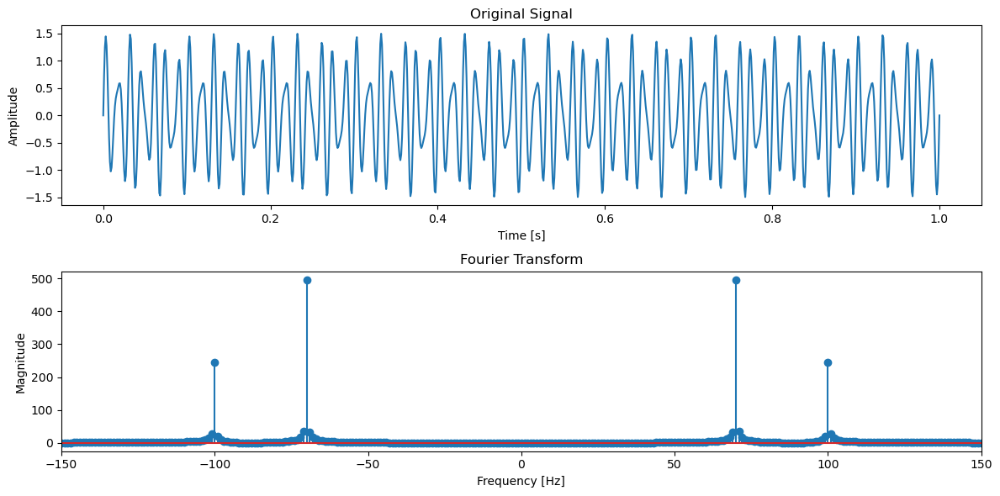

In [32]:
sampling_rate = 1000
T = 1.0 / sampling_rate
t = np.linspace(0.0, 1.0, int(1.0 / T))

freq1 = 70.0
freq2 = 100.0
signal = np.sin(2 * np.pi * freq1 * t) + 0.5 * np.sin(2 * np.pi * freq2 * t)

fft_result = np.fft.fft(signal)
fft_freq = np.fft.fftfreq(len(signal), T)

plt.figure(figsize=(12, 6))

plt.subplot(2, 1, 1)
plt.plot(t, signal)
plt.title('Original Signal')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')

plt.subplot(2, 1, 2)
plt.stem(fft_freq, np.abs(fft_result))
plt.title('Fourier Transform')
plt.xlabel('Frequency [Hz]')
plt.ylabel('Magnitude')
plt.xlim(-150, 150)

plt.tight_layout()
plt.show()

#### Plots of some common functions (sine, step, pulse, sinc, gaussian) and their Fourier spectrums

In [70]:
sampling_rate = 1000
T = 1.0 / sampling_rate

t = np.linspace(-5, 5, 1000)

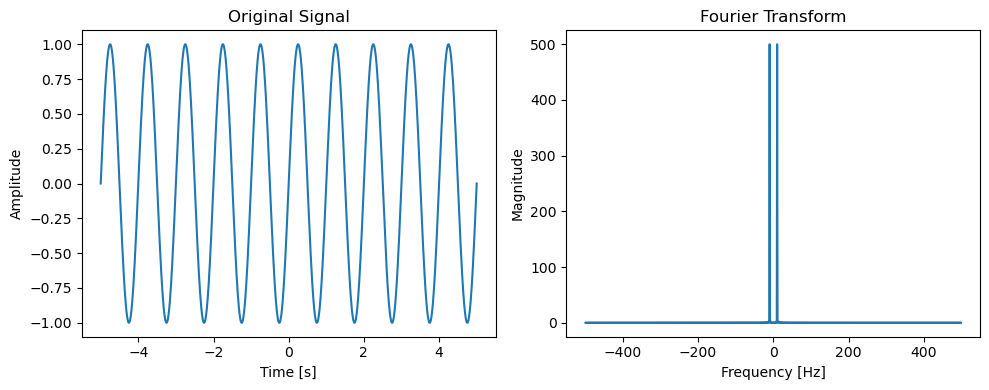

In [78]:
def sine_wave(t):
    return np.sin(2 * np.pi * t)

sine_signal = sine_wave(t)

fft_result = np.fft.fft(sine_signal)
fft_freq = np.fft.fftfreq(len(sine_signal), T)

plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
plt.plot(t, sine_signal)
plt.title('Original Signal')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')

plt.subplot(1, 2, 2)
plt.plot(fft_freq, np.abs(fft_result))
plt.title('Fourier Transform')
plt.xlabel('Frequency [Hz]')
plt.ylabel('Magnitude')

plt.tight_layout()
plt.show()

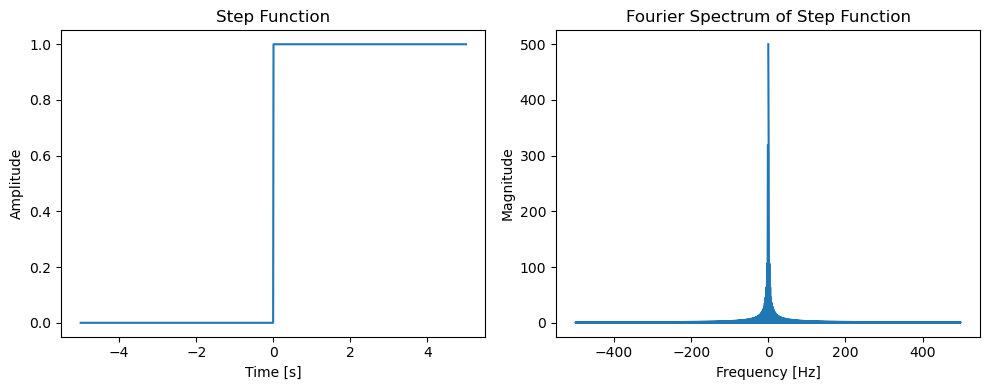

In [82]:
def step_function(t):
    return np.heaviside(t, 1)

step_signal = step_function(t)

fft_result = np.fft.fft(step_signal)
fft_freq = np.fft.fftfreq(len(step_signal), T)

plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
plt.plot(t, step_signal)
plt.title('Step Function')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')

plt.subplot(1, 2, 2)
plt.plot(fft_freq, np.abs(fft_result))
plt.title('Fourier Spectrum of Step Function')
plt.xlabel('Frequency [Hz]')
plt.ylabel('Magnitude')

plt.tight_layout()
plt.show()

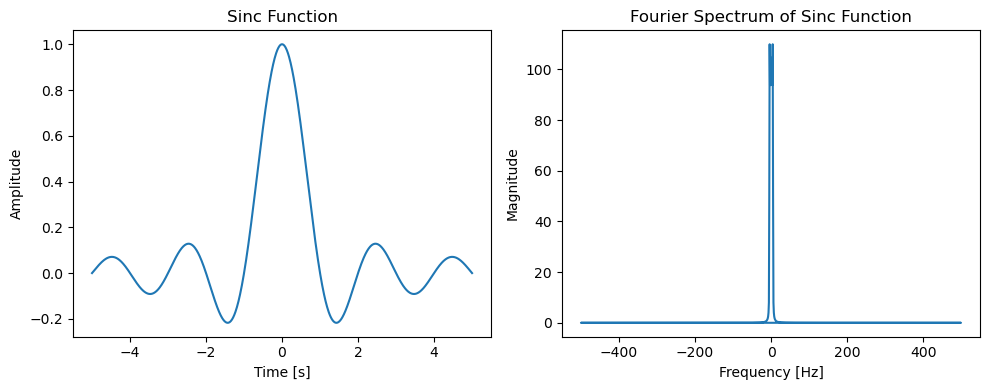

In [81]:
def sinc_function(t):
    return np.sinc(t)

sinc_signal = sinc_function(t)

fft_result = np.fft.fft(sinc_signal)
fft_freq = np.fft.fftfreq(len(sinc_signal), T)

plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
plt.plot(t, sinc_signal)
plt.title('Sinc Function')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')

plt.subplot(1, 2, 2)
plt.plot(fft_freq, np.abs(fft_result))
plt.title('Fourier Spectrum of Sinc Function')
plt.xlabel('Frequency [Hz]')
plt.ylabel('Magnitude')

plt.tight_layout()
plt.show()

## Refferences
1. https://cc-techgroup.com/terms/a/audio-signal/
2. https://swharden.com/blog/2020-09-23-signal-filtering-in-python/
3. https://www.izotope.com/en/learn/digital-audio-basics-sample-rate-and-bit-depth.html
4. https://www.scicoding.com/introduction-to-spectrograms
5. https://www.scicoding.com/how-to-do-spectrogram-in-python/
6. https://makersportal.com/blog/2018/9/13/audio-processing-in-python-part-i-sampling-and-the-fast-fourier-transform?ref=localhost
7. https://community.sw.siemens.com/s/article/what-is-the-fourier-transform
8. https://blog.native-instruments.com/audio-filters-guide/#what-is
9. https://ceid.utsa.edu/agrigoryan/wp-content/uploads/sites/23/2019/01/Art_lectures_inMaathSS.pdf
10. https://www.mathworks.com/help/matlab/math/fourier-transforms.html
11. https://home.engineering.iastate.edu/~julied/classes/ee524/LectureNotes/l5.pdf

### Audio effects

Audio effects are techniques used to process and modify an audio signal. They can change the tonal quality of the sound, add different textures and colors, or produce unique effects.

#### Reverb
Reverb, an abbreviation for reverberation, occurs when sound waves bounce off surfaces and merge with the original sound, creating a series of diminishing echoes. Picture singing in a large cathedral or yelling across a canyon; after the initial sound, your voice reflects off the surrounding surfaces, producing reverb. This is the prolonged sound you hear after the initial noise as it reflects off different objects before gradually fading.